# Hackathon 1: Creating a Attrition Report using a machine learning model



### What is a hackathon?

A hackathon is an event designed to use technology, primarily coding, to accomplish an objective. In this case, the development of a simple machine learning classifier.


<div class="alert alert-success">
<b>About Dataset</b>

<u>Context</u>

This is a fictional data set created by IBM data scientists. Uncover the factors that lead to employee attrition and explore related human resource questions we need to analyze employee information.
 Typically job class specs have information which characterize the job class- its features, and a label- in this case a pay grade - something to predict that the features are related to.

<u>Content</u>

The data is a static snapshot. The contents are

<ol>
<li>Age</li>
    <li>Attrition <b>Target variable</b></li>
<li>BusinessTravel</li>
<li>DailyRate</li>
<li>    Department</li>
<li>    DistanceFromHome</li>
<li>    Education</li>
<li>    EducationField</li>
<li>    EmployeeCount</li>
<li>    EmployeeNumber</li>
<li>    EnvironmentSatisfaction</li>
<li>    Gender</li>
<li>    HourlyRate</li>
<li>    JobInvolvement</li>
<li>    JobLevel</li>
<li>    JobRole</li>
<li>    JobSatisfaction</li>
<li>    MaritalStatus</li>
<li>    MonthlyIncome</li>
<li>    MonthlyRate</li>
<li>    NumCompaniesWorked</li>
<li>    Over18</li>
<li>    OverTime</li>
<li>    PercentSalaryHike</li>
<li>    PerformanceRating</li>
<li>    RelationshipSatisfaction</li>
<li>    StandardHours</li>
<li>    StockOptionLevel</li>
<li>    TotalWorkingYears</li>
<li>    TrainingTimesLastYear</li>
<li>    WorkLifeBalance</li>
<li>    YearsAtCompany</li>
<li>    YearsInCurrentRole</li>
<li>    YearsSinceLastPromotion</li>
<li>    YearsWithCurrManager</li>
</ol>

<u>Acknowledgements</u>

This data is purely fictional

 <u>Inspiration</u>

The intent is to use machine learning classification algorithms to predict the attrition variable from the educational level to financial budget information.
    
</div>

<div class="alert alert-info"><b>Task</b>
    
Typically attrition detection in HR is time consuming and cumbersome as a manual activity. The intent is to show how machine learning and People Analytics can be brought to bear on this task.
    
To this aim, read the dataset, locate the target variable, explore your dataset, filter out unnecessary columns, preprocess the remaining columns, create a classifier, and evaluate its results.
    
Remember to add comments to any decision you make. Comments help us to understand your code and evaluate your work correctly.
       
</div>

<div class="alert alert-danger"><b>Submission deadline:</b> Monday, January 30th, 18:40

Do not over-complicate your code too much. Start with a simple working solution and refine it if you have time.
</div>

In [30]:
import pandas as pd
import sklearn
import matplotlib.pyplot as plt 
import seaborn as sns 
import numpy as np

## Data Exploration/ filtering 

In [26]:
df=pd.read_csv("hackathon_1_sec_B_revisisted.csv")

In [9]:
pd.set_option('display.max_columns', None)
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [40]:
#Seperating target variable
y=df['Attrition']
X=df.drop('Attrition', axis='columns')

In [74]:
# create two seperate datasets: one with the numerical fields and the other with categorical fields 
numeric_data = X.select_dtypes(include=[np.number])
categorical_data = X.select_dtypes(exclude=[np.number])
#Create two lists of the fields of these two datasets
numerical_fields=list(numeric_data.columns)
categorical_fields=list(categorical_data.columns)

In [62]:
for x in categorical_fields:
    v= df[x].nunique()
    print(f'for {x} the number of unique values is {v}')

for BusinessTravel the number of unique values is 3
for Department the number of unique values is 3
for EducationField the number of unique values is 6
for Gender the number of unique values is 2
for JobRole the number of unique values is 9
for MaritalStatus the number of unique values is 3
for Over18 the number of unique values is 1
for OverTime the number of unique values is 2


In [110]:
#Since this field has 1 unique value, it is useless statistiacally
X= X.drop('Over18', axis=1)


KeyError: "['Over18'] not found in axis"

In [111]:
categorical_fields.remove('Over18')

In [66]:
numeric_data.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,RelationshipSatisfaction,StandardHours,StockOptionLevel,TrainingTimesLastYear,WorkLifeBalance
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,14313.103401,2.693197,15.209524,2.712245,80.0,0.793878,2.799320,2.761224
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,7117.786044,2.498009,3.659938,1.081209,0.0,0.852077,1.289271,0.706476
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,2094.000000,0.000000,11.000000,1.000000,80.0,0.000000,0.000000,1.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,8047.000000,1.000000,12.000000,2.000000,80.0,0.000000,2.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,14235.500000,2.000000,14.000000,3.000000,80.0,1.000000,3.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,20461.500000,4.000000,18.000000,4.000000,80.0,1.000000,3.000000,3.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,26999.000000,9.000000,25.000000,4.000000,80.0,3.000000,6.000000,4.000000


In [ ]:
#take upper triangle of the matrix and check columns which have correlation > 0.75 with an other feature
#triangle = correlation.where(np.triu(np.ones(correlation.shape),k=1).astype(np.bool_))
#to_drop = [column for column in triangle.columns if any(triangle[column] > 0.75)]
#print("Columns to drop:", to_drop)

#drop those correlated features
#X = X.drop(to_drop, axis=1)

In [97]:
#check correlation and display correlation matrix
correlation = numeric_data.corr().abs()
display(correlation.style.background_gradient(cmap='coolwarm'))

/Users/nathanielthomascopeland/.pyenv/versions/3.11.3/lib/python3.11/site-packages/pandas/io/formats/style.py:3618: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(gmap) if vmin is None else vmin
/Users/nathanielthomascopeland/.pyenv/versions/3.11.3/lib/python3.11/site-packages/pandas/io/formats/style.py:3619: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(gmap) if vmax is None else vmax


,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,RelationshipSatisfaction,StandardHours,StockOptionLevel,TrainingTimesLastYear,WorkLifeBalance
Age,1.000000,0.010661,0.001686,0.208034,nan,0.010145,0.010146,0.024287,0.029820,0.509604,0.004892,0.028051,0.299635,0.003634,0.053535,nan,0.037510,0.019621,0.021490
DailyRate,0.010661,1.000000,0.004985,0.016806,nan,0.050990,0.018355,0.023381,0.046135,0.002966,0.030571,0.032182,0.038153,0.022704,0.007846,nan,0.042143,0.002453,0.037848
DistanceFromHome,0.001686,0.004985,1.000000,0.021042,nan,0.032916,0.016075,0.031131,0.008783,0.005303,0.003669,0.027473,0.029251,0.040235,0.006557,nan,0.044872,0.036942,0.026556
Education,0.208034,0.016806,0.021042,1.000000,nan,0.042070,0.027128,0.016775,0.042438,0.101589,0.011296,0.026084,0.126317,0.011111,0.009118,nan,0.018422,0.025100,0.009819
EmployeeCount,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
EmployeeNumber,0.010145,0.050990,0.032916,0.042070,nan,1.000000,0.017621,0.035179,0.006888,0.018519,0.046247,0.012648,0.001251,0.012944,0.069861,nan,0.062227,0.023603,0.010309
EnvironmentSatisfaction,0.010146,0.018355,0.016075,0.027128,nan,0.017621,1.000000,0.049857,0.008278,0.001212,0.006784,0.037600,0.012594,0.031701,0.007665,nan,0.003432,0.019359,0.027627
HourlyRate,0.024287,0.023381,0.031131,0.016775,nan,0.035179,0.049857,1.000000,0.042861,0.027853,0.071335,0.015297,0.022157,0.009062,0.001330,nan,0.050263,0.008548,0.004607
JobInvolvement,0.029820,0.046135,0.008783,0.042438,nan,0.006888,0.008278,0.042861,1.000000,0.012630,0.021476,0.016322,0.015012,0.017205,0.034297,nan,0.021523,0.015338,0.014617
JobLevel,0.509604,0.002966,0.005303,0.101589,nan,0.018519,0.001212,0.027853,0.012630,1.000000,0.001944,0.039563,0.142501,0.034730,0.021642,nan,0.013984,0.018191,0.037818


In [44]:
# Calculate the correlation matrix
corr = numeric_data.corr().abs()

# Select upper triangle of correlation matrix
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.6)]

# Drop features 
X.drop(to_drop, axis=1, inplace=True)

In [101]:
#In view of numerical fields analysis and correlation, we have deicded to drop StandardHours and EmployeeCount
X=X.drop(['StandardHours','EmployeeCount'], axis='columns')

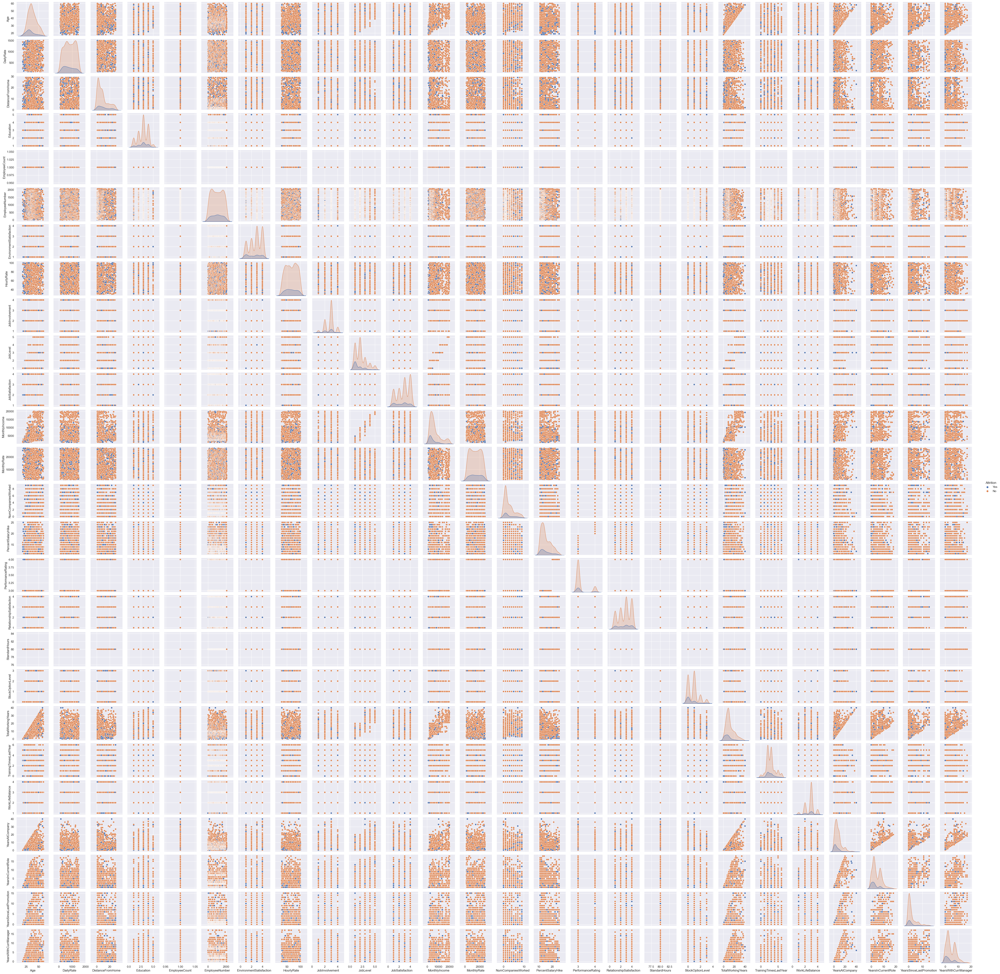

In [48]:
sns.set()
sns.pairplot(df, hue='Attrition', height=2)

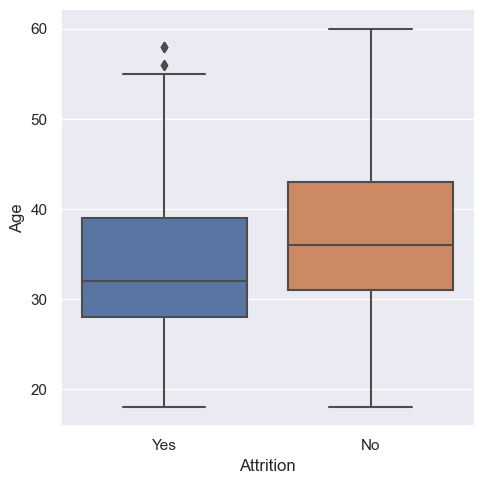

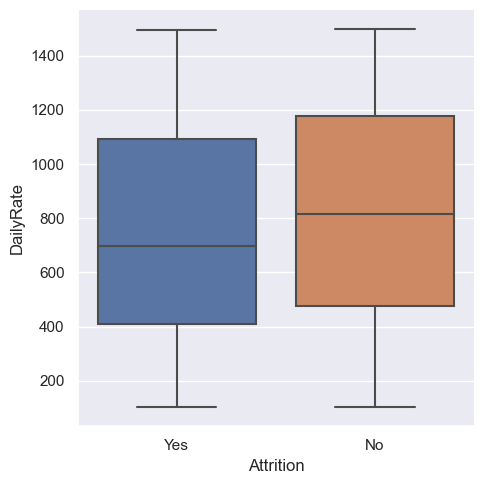

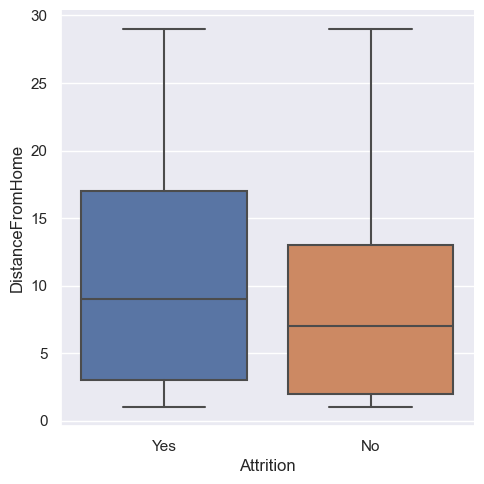

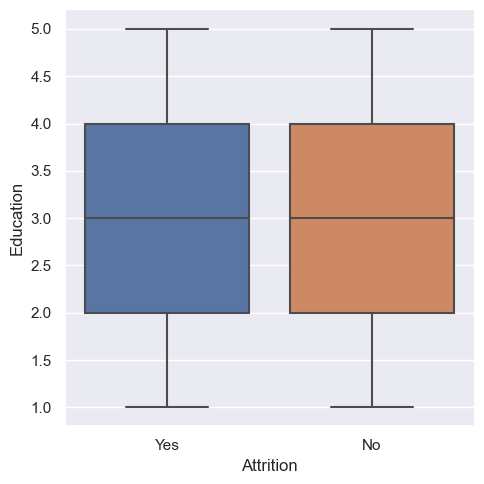

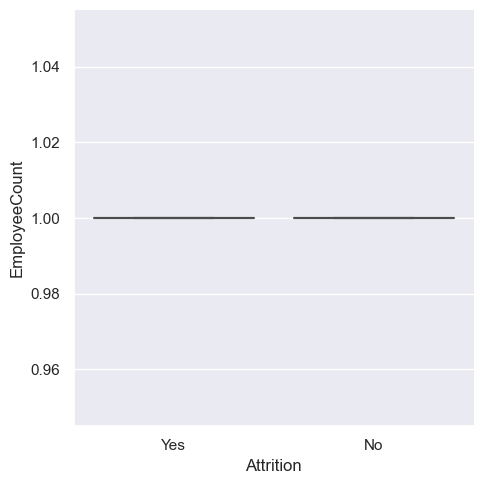

...

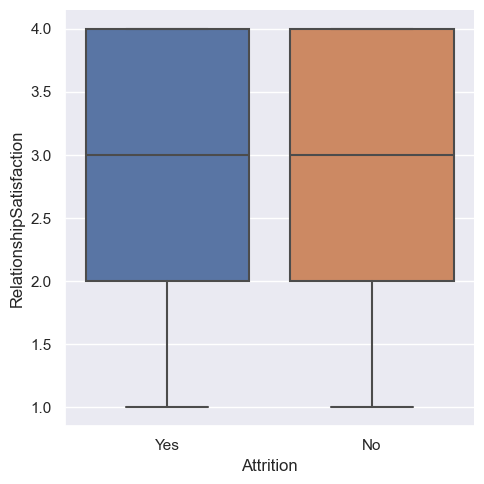

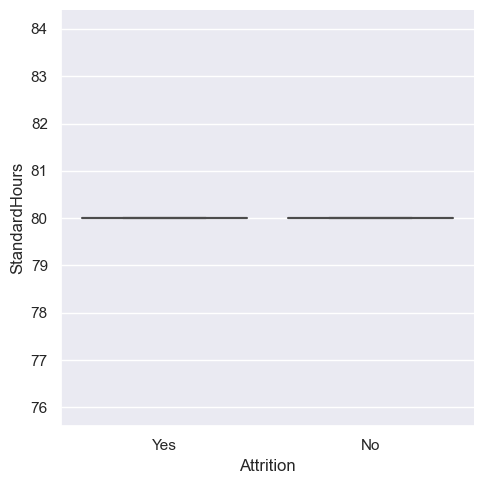

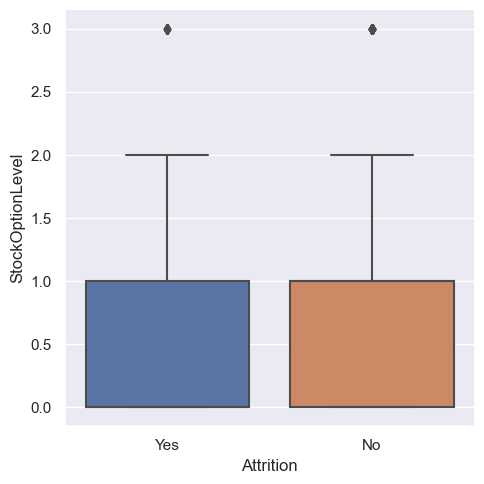

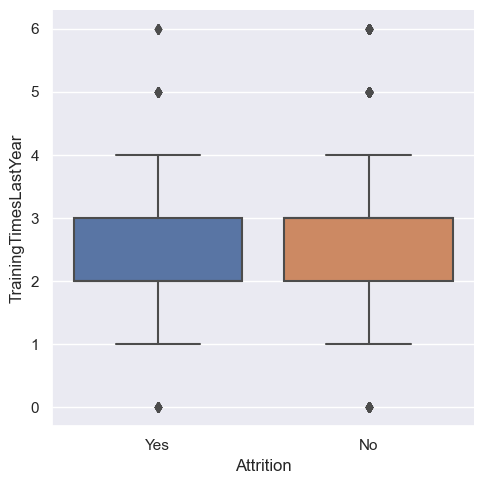

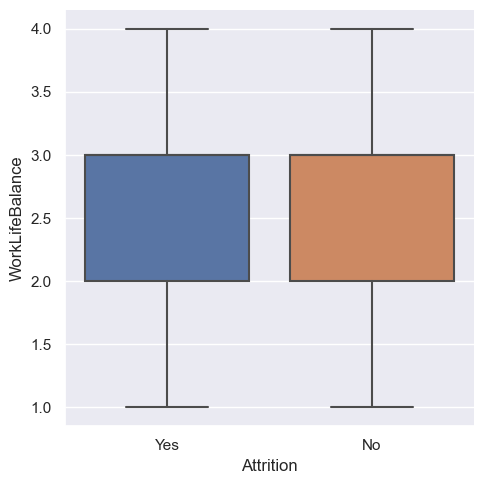

In [56]:
for x in numerical_fields:
    sns.catplot(x="Attrition",
                y=x,
data=df,
kind="box")

plt.show()

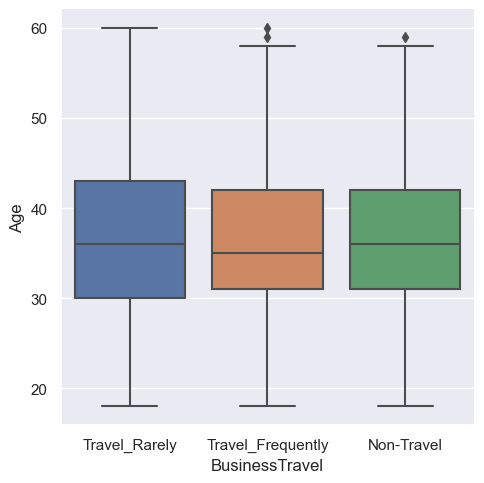

## Preprocessing & Model training & Model assessment


In [114]:
#Test/Train split 
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test= train_test_split(X,y)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1102, 24), (368, 24), (1102,), (368,))

In [ ]:
#No need to do any imputing since there are no missing values. Will just encode the categorical features

In [75]:
#Based on the little analysis of the dataset, we have concluded that we only want to ordinal encode BusinessTravel, the rest will be onehotencoded
#We also decided to standard scale the numerical features as there are big differences in their distributions 
#The models we will train are a Logistic regression, a decision tree classifier

categorical_fields.remove('BusinessTravel')
ord_enc_field='BusinessTravel'

In [115]:
#LR with StandardScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
#Creation of a pipeline that will: scale the numerical fields, encode the categorical fields 
scaler= StandardScaler()
categories=[['Non-Travel', 'Travel_Rarely', 'Travel_Frequently']]
ordinal_enc = OrdinalEncoder(categories=categories)
ohe= OneHotEncoder(sparse=False)
lr= LogisticRegression()

#defining the steps of the pipe
transformer = ColumnTransformer([('ohe', ohe, categorical_fields),('ordinal_enc', ordinal_enc, ['BusinessTravel'])], remainder='passthrough')
steps=[('preprocess', transformer),('scaler', scaler), ('lr', lr)]
pipe_lr=Pipeline(steps)
pipe_lr.fit(X_train, y_train)
pipe_lr.predict(X_test)
pipe_lr.score(X_test, y_test)




/Users/nathanielthomascopeland/.pyenv/versions/3.11.3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


0.8722826086956522

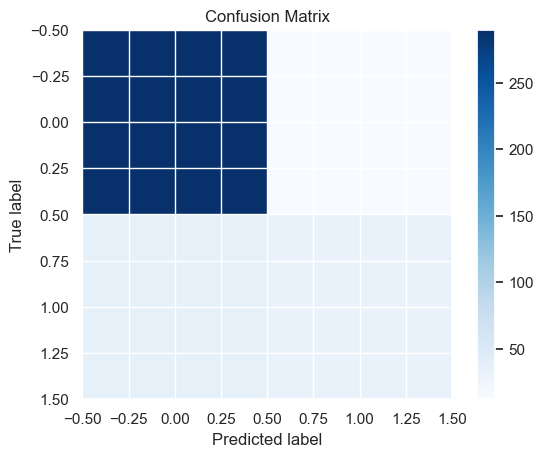

In [116]:
from sklearn.metrics import confusion_matrix

# Make predictions on the test set
y_pred = pipe_lr.predict(X_test)

# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Display the confusion matrix
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [117]:
#LR with MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
#Creation of a pipeline that will: scale the numerical fields, encode the categorical fields 
scaler= MinMaxScaler()
categories=[['Non-Travel', 'Travel_Rarely', 'Travel_Frequently']]
ordinal_enc = OrdinalEncoder(categories=categories)
ohe= OneHotEncoder(sparse=False)
lr= LogisticRegression()

#defining the steps of the pipe
transformer = ColumnTransformer([('ohe', ohe, categorical_fields),('ordinal_enc', ordinal_enc, ['BusinessTravel'])], remainder='passthrough')
steps=[('preprocess', transformer),('scaler', scaler), ('lr', lr)]
pipe_lr=Pipeline(steps)
pipe_lr.fit(X_train, y_train)
pipe_lr.predict(X_test)
pipe_lr.score(X_test, y_test)


/Users/nathanielthomascopeland/.pyenv/versions/3.11.3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


0.8777173913043478

In [118]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier
#Creation of a pipeline that will: scale the numerical fields, encode the categorical fields 
scaler= StandardScaler()
categories=[['Non-Travel', 'Travel_Rarely', 'Travel_Frequently']]
ordinal_enc = OrdinalEncoder(categories=categories)
ohe= OneHotEncoder(sparse=False)
dtc= DecisionTreeClassifier()

#defining the steps of the pipe
transformer = ColumnTransformer([('ohe', ohe, categorical_fields),('ordinal_enc', ordinal_enc, ['BusinessTravel'])], remainder='passthrough')
steps=[('preprocess', transformer),('scaler', scaler), ('dtc', dtc)]
pipe_dt=Pipeline(steps)
pipe_dt.fit(X_train, y_train)
pipe_dt.predict(X_train)
pipe_dt.score(X_test, y_test)


/Users/nathanielthomascopeland/.pyenv/versions/3.11.3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


0.7934782608695652

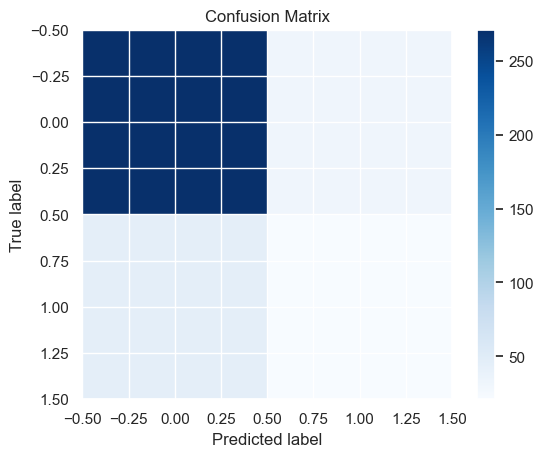

In [119]:
from sklearn.metrics import confusion_matrix

# Make predictions on the test set
y_pred_dt = pipe_dt.predict(X_test)

# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred_dt)

# Display the confusion matrix
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

## Conclusions

LR model performed much better with an overall accuracy of 88% vs 79% from the DT. Between the different types of normalization, and we went ahead with MinMax due to higher performance. Therefore, logistic regression with MinMax Scaler is the best. In terms of improvements, we could have run cross-validation and gridsearch to improve the model performance but it is out of scope of this Hackathon!